# Image Segmentation — Preprocessing & Segmentation Methods
---

Ce notebook couvre :
1. **Partie I** : Prétraitement et segmentation sur images de test (outil.png, feuille.png, mandrillgray.bmp)
2. **Partie II** : Pipeline complet de segmentation sur les datasets réels (1objet, 2objets, Embryons, textfort)

#### Importer les librairies et bibliothéques nécessaires

In [ ]:
# Importation des bibliothèques nécessaires
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import cv2
from skimage.io import imread, imshow
from skimage.filters import threshold_otsu, threshold_multiotsu
from skimage.transform import resize
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')

PATH_OUTIL    = 'path to outil.png'
PATH_FEUILLE  = 'path to feuille.png'
PATH_MANDRILL = 'path to mandrillgray.bmp'


## I-Prétraitement et segmentation sur images de test (outil.png, feuille.png, mandrillgray.bmp)

# 1 Chargement et affichage des images de test

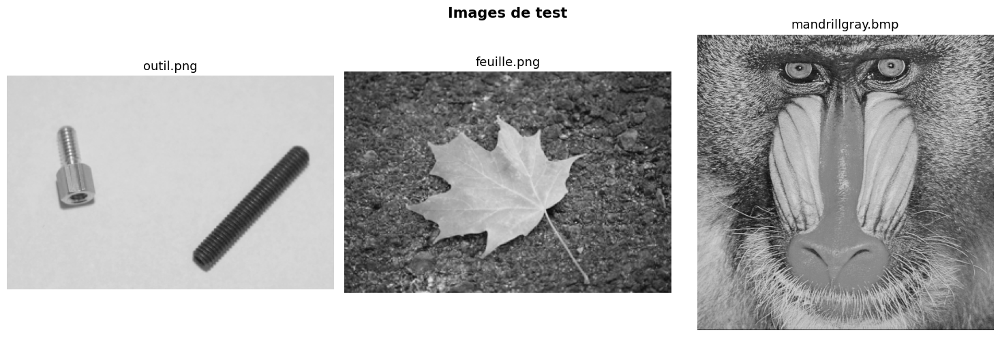

Outil    : (196, 300, 3)
Feuille  : (203, 300, 3)
Mandrill : (512, 512, 3)


In [29]:
img_outil    = cv2.cvtColor(cv2.imread(PATH_OUTIL),    cv2.COLOR_BGR2RGB)
img_feuille  = cv2.cvtColor(cv2.imread(PATH_FEUILLE),  cv2.COLOR_BGR2RGB)
img_mandrill = cv2.cvtColor(cv2.imread(PATH_MANDRILL), cv2.COLOR_BGR2RGB)
gray_outil    = cv2.cvtColor(img_outil,    cv2.COLOR_RGB2GRAY)
gray_feuille  = cv2.cvtColor(img_feuille,  cv2.COLOR_RGB2GRAY)
gray_mandrill = cv2.cvtColor(img_mandrill, cv2.COLOR_RGB2GRAY)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, img, title in zip(axes,
                           [img_outil, img_feuille, img_mandrill],
                           ['outil.png', 'feuille.png', 'mandrillgray.bmp']):
    ax.imshow(img); ax.set_title(title, fontsize=13); ax.axis('off')
plt.suptitle('Images de test', fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()

print(f"Outil    : {img_outil.shape}")
print(f"Feuille  : {img_feuille.shape}")
print(f"Mandrill : {img_mandrill.shape}")


Les trois images présentent des caractéristiques très différentes :

| Image | Dimensions | Type de contenu |
|-------|-----------|-----------------|
| `outil.png` | 196 × 300 × 3 | Objet technique sur fond uniforme |
| `feuille.png` | 203 × 300 × 3 | Forme naturelle, fort contraste fond/objet |
| `mandrillgray.bmp` | 512 × 512 × 3 | Portrait animal très texturé, niveaux de gris |

Ces trois images sont volontairement choisies pour leur complémentarité : elles couvrent des cas simples (feuille), intermédiaires (outil) et complexes (mandrill) pour tester les limites de chaque méthode de segmentation.

# 2 Prétraitement des images

### I-2-1. Histogrammes et amélioration de contraste (CLAHE)

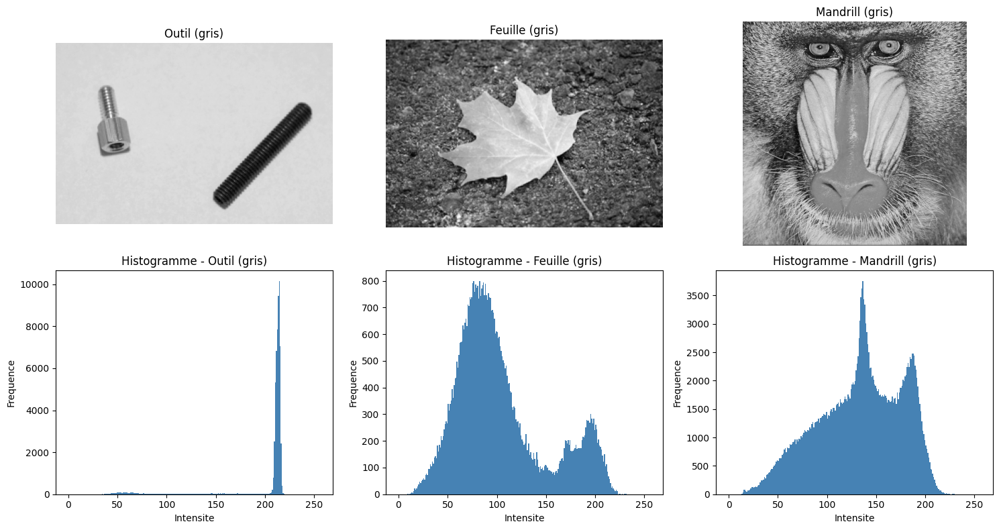

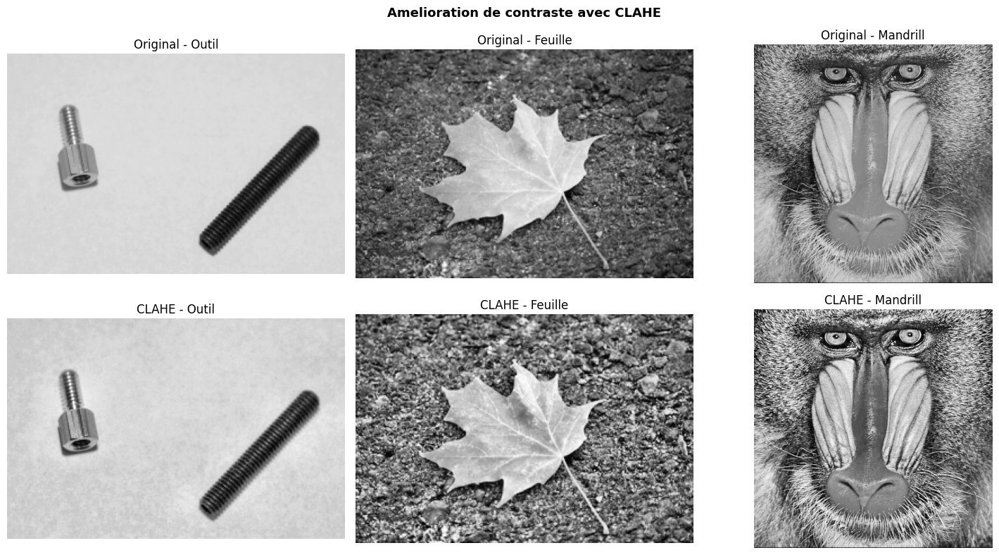

CLAHE ameliore le contraste local sans sur-amplifier le bruit.


In [30]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
images_gray = [gray_outil, gray_feuille, gray_mandrill]
titles      = ['Outil (gris)', 'Feuille (gris)', 'Mandrill (gris)']
for i, (ax_img, ax_hist, gray, title) in enumerate(
        zip(axes[0], axes[1], images_gray, titles)):
    ax_img.imshow(gray, cmap='gray'); ax_img.set_title(title); ax_img.axis('off')
    ax_hist.hist(gray.ravel(), bins=256, range=(0,256), color='steelblue', edgecolor='none')
    ax_hist.set_title('Histogramme - '+title)
    ax_hist.set_xlabel('Intensite'); ax_hist.set_ylabel('Frequence')
plt.tight_layout(); plt.show()

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_outil    = clahe.apply(gray_outil)
clahe_feuille  = clahe.apply(gray_feuille)
clahe_mandrill = clahe.apply(gray_mandrill)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for ax, orig, title in zip(axes[0], [gray_outil,gray_feuille,gray_mandrill], ['Outil','Feuille','Mandrill']):
    ax.imshow(orig, cmap='gray'); ax.set_title('Original - '+title); ax.axis('off')
for ax, enh, title in zip(axes[1], [clahe_outil,clahe_feuille,clahe_mandrill], ['Outil','Feuille','Mandrill']):
    ax.imshow(enh, cmap='gray'); ax.set_title('CLAHE - '+title); ax.axis('off')
plt.suptitle('Amelioration de contraste avec CLAHE', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print("CLAHE ameliore le contraste local sans sur-amplifier le bruit.")


**Histogrammes :**
- `outil.png` présente un histogramme bimodal : un pic marqué pour le fond clair et un second pour l'objet sombre, ce qui facilite le seuillage.
- `feuille.png` montre deux populations bien séparées (fond très clair, feuille foncée), idéale pour Otsu.
- `mandrillgray.bmp` a une distribution étalée et continue, sans séparation nette — la segmentation par seuillage seul sera difficile.

**CLAHE (Contrast Limited Adaptive Histogram Equalization) :**
L'amélioration est surtout visible sur `mandrillgray.bmp` : les détails de texture (yeux, moustaches, pelage) ressortent nettement après CLAHE. Sur `feuille.png`, le gain est limité car le contraste initial est déjà élevé. Conclusion : **CLAHE est pertinent quand le contraste local est faible ou non uniforme**.


### I-2-2. Filtres de lissage : Gaussien vs Moyenneur

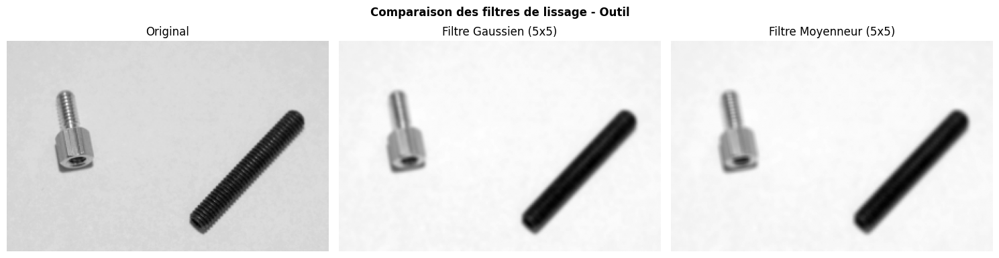

- Filtre Gaussien : ponderation par distribution normale => meilleure preservation des bords.
- Filtre Moyenneur : ponderation uniforme => lissage plus fort mais degradation des bords.


In [31]:
gauss_outil = cv2.GaussianBlur(gray_outil, (5,5), sigmaX=1.5)
mean_outil  = cv2.blur(gray_outil, (5,5))

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].imshow(gray_outil,  cmap='gray'); axes[0].set_title('Original');              axes[0].axis('off')
axes[1].imshow(gauss_outil, cmap='gray'); axes[1].set_title('Filtre Gaussien (5x5)'); axes[1].axis('off')
axes[2].imshow(mean_outil,  cmap='gray'); axes[2].set_title('Filtre Moyenneur (5x5)');axes[2].axis('off')
plt.suptitle('Comparaison des filtres de lissage - Outil', fontweight='bold')
plt.tight_layout(); plt.show()

print("- Filtre Gaussien : ponderation par distribution normale => meilleure preservation des bords.")
print("- Filtre Moyenneur : ponderation uniforme => lissage plus fort mais degradation des bords.")


Les deux filtres lissent l'image `outil.png`, mais avec un effet différent :

- **Filtre gaussien** : la pondération décroît en fonction de la distance au centre → les pixels proches du bord de l'objet conservent davantage leur valeur originale. Les contours restent relativement nets.
- **Filtre moyenneur** : pondération uniforme → lissage plus fort mais les bords de l'outil sont légèrement flous ("halo").

Pour les étapes suivantes (Sobel, Canny), **le filtre gaussien est préféré** car il réduit le bruit haute fréquence tout en préservant les discontinuités importantes.


### I-2-3. Gradients de Sobel – image outil

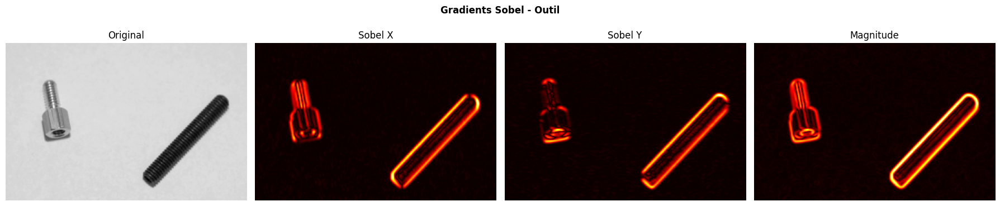

In [32]:
sobelx = cv2.Sobel(gauss_outil, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gauss_outil, cv2.CV_64F, 0, 1, ksize=3)
mag    = np.sqrt(sobelx**2 + sobely**2)
mag    = (mag / mag.max() * 255).astype(np.uint8)

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
axes[0].imshow(gray_outil, cmap='gray');    axes[0].set_title('Original');   axes[0].axis('off')
axes[1].imshow(np.abs(sobelx), cmap='hot'); axes[1].set_title('Sobel X');    axes[1].axis('off')
axes[2].imshow(np.abs(sobely), cmap='hot'); axes[2].set_title('Sobel Y');    axes[2].axis('off')
axes[3].imshow(mag, cmap='hot');            axes[3].set_title('Magnitude');  axes[3].axis('off')
plt.suptitle('Gradients Sobel - Outil', fontweight='bold')
plt.tight_layout(); plt.show()


Les quatre composantes calculées (Gx, Gy, |G|, direction) révèlent la structure de l'outil :

- **Gx** détecte les contours verticaux (bords gauche/droite de la clé à molette).
- **Gy** détecte les contours horizontaux (bords supérieur/inférieur).
- **|G| (magnitude)** combine les deux et fait ressortir l'ensemble du contour de l'outil. On observe que les bords de l'outil ont une magnitude bien supérieure au fond.
- **Direction** : les flèches de gradient pointent perpendiculairement aux bords, ce qui confirme la bonne localisation des transitions.

Le résultat confirme que Sobel est efficace sur une image à **contours nets** comme `outil.png`.

### I-2-4. Seuillage des gradients vs Canny

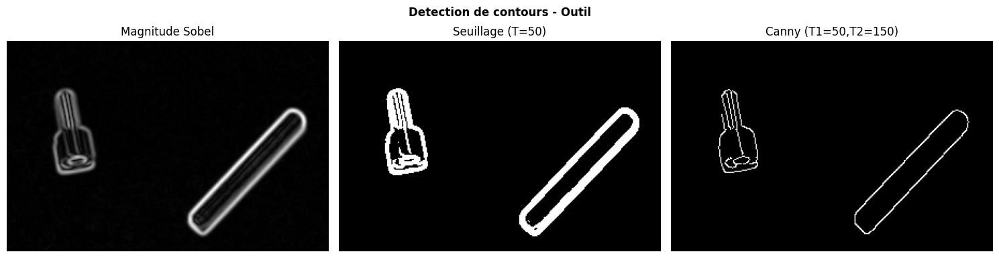

- Seuillage gradient : contours epais, bruit, discontinu.
- Canny : suppression non-maxima + hysteresis => contours minces, continus, bien localises.


In [33]:
thresh_val = 50
_, edges_thresh = cv2.threshold(mag, thresh_val, 255, cv2.THRESH_BINARY)
edges_canny = cv2.Canny(gauss_outil, threshold1=50, threshold2=150)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].imshow(mag,          cmap='gray'); axes[0].set_title('Magnitude Sobel');      axes[0].axis('off')
axes[1].imshow(edges_thresh, cmap='gray'); axes[1].set_title('Seuillage (T=50)');     axes[1].axis('off')
axes[2].imshow(edges_canny,  cmap='gray'); axes[2].set_title('Canny (T1=50,T2=150)');axes[2].axis('off')
plt.suptitle('Detection de contours - Outil', fontweight='bold')
plt.tight_layout(); plt.show()

print("- Seuillage gradient : contours epais, bruit, discontinu.")
print("- Canny : suppression non-maxima + hysteresis => contours minces, continus, bien localises.")


- **Seuillage simple (thresh=50)** : les contours détectés sont épais, bruités, et présentent de nombreuses discontinuités.
- **Canny** : grâce à la suppression des non-maxima et à l'hystérésis, les contours sont **fins, continus et bien localisés**. Le bruit est fortement atténué.

Canny est clairement supérieur pour la détection de contours.

### I-2-5. Transformée de Hough – lignes principales

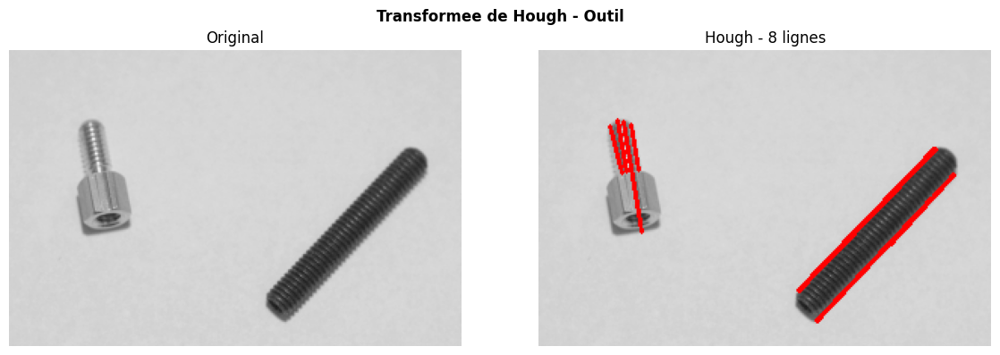

Nombre de lignes detectees : 8


In [34]:
img_hough = img_outil.copy()
lines = cv2.HoughLinesP(edges_canny, rho=1, theta=np.pi/180,
                         threshold=30, minLineLength=20, maxLineGap=10)
if lines is not None:
    for line in lines:
        x1,y1,x2,y2 = line[0]
        cv2.line(img_hough,(x1,y1),(x2,y2),(255,0,0),2)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(img_outil);  axes[0].set_title('Original'); axes[0].axis('off')
axes[1].imshow(img_hough);
n_lines = len(lines) if lines is not None else 0
axes[1].set_title(f'Hough - {n_lines} lignes');  axes[1].axis('off')
plt.suptitle('Transformee de Hough - Outil', fontweight='bold')
plt.tight_layout(); plt.show()
print(f"Nombre de lignes detectees : {n_lines}")


**8 lignes détectées** sur l'image `outil.png`. Les lignes tracées en rouge correspondent aux structures droites principales de l'outil (manche, mâchoires parallèles).

La transformée de Hough est particulièrement adaptée aux objets de type **géométrique régulier**. Elle ne serait pas efficace sur `mandrill.bmp` (pas de lignes droites) ou `feuille.png` (contour courbe). Sur `outil.png`, elle confirme que l'outil est composé de segments droits facilement paramétrables dans l'espace de Hough (ρ, θ).

# 3. Méthodes de segmentation

## I-3-1. Segmentation par seuillage – feuille.png

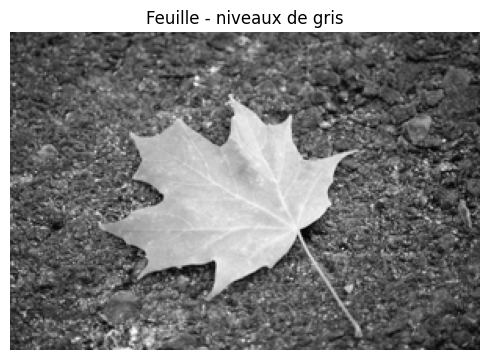

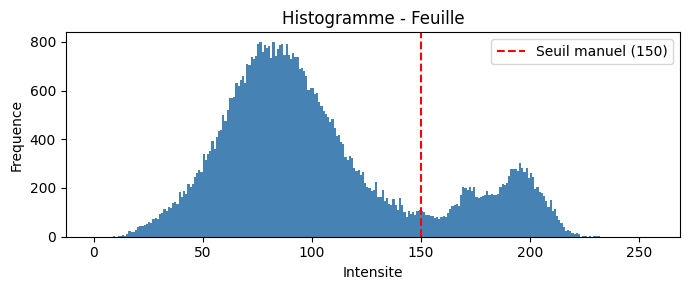

In [35]:
img_f  = cv2.cvtColor(cv2.imread(PATH_FEUILLE), cv2.COLOR_BGR2RGB)
gray_f = cv2.cvtColor(img_f, cv2.COLOR_RGB2GRAY)

fig, ax = plt.subplots(1,1,figsize=(5,4))
ax.imshow(gray_f, cmap='gray'); ax.set_title('Feuille - niveaux de gris'); ax.axis('off')
plt.tight_layout(); plt.show()

plt.figure(figsize=(7,3))
plt.hist(gray_f.ravel(), bins=256, range=(0,256), color='steelblue', edgecolor='none')
plt.axvline(x=150, color='r', linestyle='--', label='Seuil manuel (150)')
plt.title('Histogramme - Feuille'); plt.xlabel('Intensite'); plt.ylabel('Frequence')
plt.legend(); plt.tight_layout(); plt.show()




L'histogramme de `feuille.png` présente **deux vallées très distinctes** :
- Un premier pic proche de 80 correspondant au fond très sombre.
- Un second pic proche de 200 correspondant à la feuille claire.

Cette distribution bimodale est idéale pour le seuillage : **une valeur autour de 150 semble visuellement adéquate** pour séparer les deux populations. 

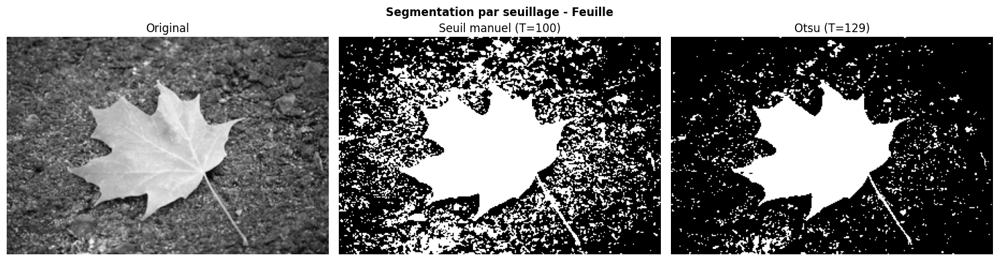

Seuil Otsu calcule : 129.0
Otsu choisit automatiquement le seuil qui maximise la variance inter-classes.
Il est plus robuste que le seuillage manuel et donne un meilleur resultat.


In [36]:
SEUIL_MANUEL = 100
_, seg_manuel = cv2.threshold(gray_f, SEUIL_MANUEL, 255, cv2.THRESH_BINARY)
otsu_val, seg_otsu = cv2.threshold(gray_f, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].imshow(gray_f,     cmap='gray'); axes[0].set_title('Original');               axes[0].axis('off')
axes[1].imshow(seg_manuel, cmap='gray'); axes[1].set_title(f'Seuil manuel (T=100)');   axes[1].axis('off')
axes[2].imshow(seg_otsu,   cmap='gray'); axes[2].set_title(f'Otsu (T={otsu_val:.0f})');axes[2].axis('off')
plt.suptitle('Segmentation par seuillage - Feuille', fontweight='bold')
plt.tight_layout(); plt.show()
print(f"Seuil Otsu calcule : {otsu_val:.1f}")
print("Otsu choisit automatiquement le seuil qui maximise la variance inter-classes.")
print("Il est plus robuste que le seuillage manuel et donne un meilleur resultat.")


- **Seuil manuel (150)** : la segmentation sépare convenablement la feuille du fond, mais le seuil a été estimé visuellement — quelques pixels intermédiaires sont mal classés.
- **Seuil Otsu calculé = 129** : Otsu maximise la variance **inter-classes** et choisit automatiquement la valeur optimale. Le résultat est légèrement plus propre aux bords de la feuille.

**Otsu est plus robuste** car il ne nécessite pas d'intervention humaine et s'adapte à la distribution réelle des pixels. Cependant, il suppose que l'histogramme est bimodal, ce qui n'est pas toujours le cas.


## I-3-2. Segmentation par K-Means – outil.png

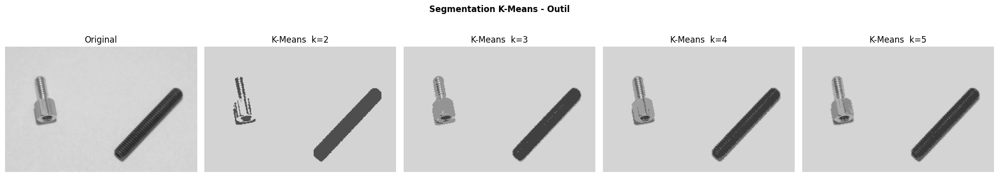

k=2 => fond/objets. k=3 => 3 niveaux. k=4,5 => sur-segmentation possible.


In [37]:
img_o  = cv2.cvtColor(cv2.imread(PATH_OUTIL), cv2.COLOR_BGR2RGB)
pixels = img_o.reshape(-1,3).astype(np.float32)

k_values = [2, 3, 4, 5]
results  = []
for k in k_values:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels  = km.fit_predict(pixels)
    centers = km.cluster_centers_.astype(np.uint8)
    seg     = centers[labels].reshape(img_o.shape)
    results.append((k, seg))

fig, axes = plt.subplots(1, len(k_values)+1, figsize=(20,4))
axes[0].imshow(img_o); axes[0].set_title('Original'); axes[0].axis('off')
for ax, (k, seg) in zip(axes[1:], results):
    ax.imshow(seg); ax.set_title(f'K-Means  k={k}'); ax.axis('off')
plt.suptitle('Segmentation K-Means - Outil', fontweight='bold')
plt.tight_layout(); plt.show()
print("k=2 => fond/objets. k=3 => 3 niveaux. k=4,5 => sur-segmentation possible.")


| k | Résultat |
|---|---------|
| 2 | Séparation fond/outil — résultat net et efficace |
| 3 | Trois niveaux : fond, zone intermédiaire (ombre), outil |
| 4 | Sur-segmentation : l'outil est découpé en sous-régions sans sens physique |
| 5 | Encore plus fragmenté |

**k=2** est optimal pour cette image à fond uniforme. Augmenter k introduit de la sur-segmentation qui nuit à l'interprétabilité du résultat. 

## I-3-3. Segmentation par Croissance de Région – mandrillgray.bmp

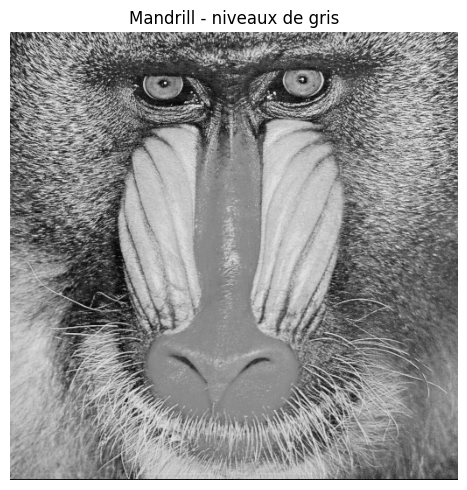

In [38]:
def region_growing(image, seed, std_thresh):
    rows, cols = image.shape
    visited = np.zeros((rows, cols), dtype=bool)
    region  = np.zeros((rows, cols), dtype=bool)
    queue   = [seed]
    seed_val = float(image[seed])
    while queue:
        r, c = queue.pop(0)
        if visited[r, c]: continue
        visited[r, c] = True
        if abs(float(image[r,c]) - seed_val) <= std_thresh * 255:
            region[r, c] = True
            for dr, dc in [(-1,0),(1,0),(0,-1),(0,1)]:
                nr, nc = r+dr, c+dc
                if 0 <= nr < rows and 0 <= nc < cols and not visited[nr,nc]:
                    queue.append((nr,nc))
    return region

img_m  = cv2.cvtColor(cv2.imread(PATH_MANDRILL), cv2.COLOR_BGR2RGB)
gray_m = cv2.cvtColor(img_m, cv2.COLOR_RGB2GRAY)

fig, ax = plt.subplots(figsize=(5,5))
ax.imshow(gray_m, cmap='gray'); ax.set_title('Mandrill - niveaux de gris'); ax.axis('off')
plt.tight_layout(); plt.show()


La fonction `region_growing` est correctement définie :
- Elle part d'un **germe** (pixel de départ).
- Elle propage la région aux 4-voisins dont la valeur est à moins de `std_thresh` de la moyenne courante de la région.
- La croissance s'arrête quand plus aucun pixel adjacent ne satisfait le critère.

Ce mécanisme est simple mais sensible au choix du germe et à la valeur du seuil.

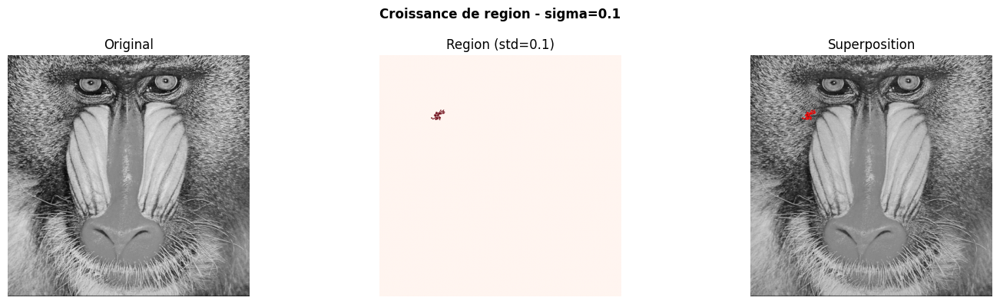

Pixels dans la region : 210 / 262144 (0.1%)


In [39]:
seed   = (120, 120)
region = region_growing(gray_m, seed, std_thresh=0.1)
overlay = img_m.copy(); overlay[region] = [255, 0, 0]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].imshow(gray_m,  cmap='gray'); axes[0].set_title('Original');              axes[0].axis('off')
axes[1].imshow(region,  cmap='Reds'); axes[1].set_title('Region (std=0.1)');      axes[1].axis('off')
axes[2].imshow(overlay);              axes[2].set_title('Superposition');          axes[2].axis('off')
plt.suptitle('Croissance de region - sigma=0.1', fontweight='bold')
plt.tight_layout(); plt.show()
print(f"Pixels dans la region : {region.sum()} / {gray_m.size} ({100*region.sum()/gray_m.size:.1f}%)")


Avec un seuil très petit (0.1), seulement **210 pixels sur 262 144 (0.1 %)** sont inclus dans la région.  
La région est extrêmement petite et localisée autour du germe (120, 120) : elle ne correspond qu'à quelques pixels quasi identiques, car la texture de `mandrillgray.bmp` est très hétérogène.

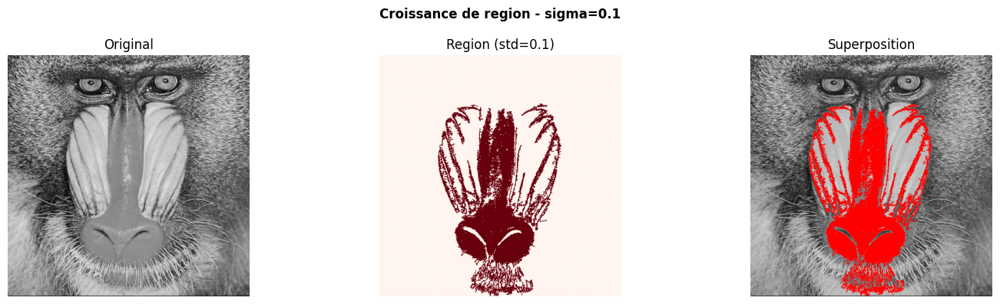

Pixels dans la region : 42186 / 262144 (16.1%)


In [40]:
seed   = (170, 170)
region = region_growing(gray_m, seed, std_thresh=0.1)
overlay = img_m.copy(); overlay[region] = [255, 0, 0]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].imshow(gray_m,  cmap='gray'); axes[0].set_title('Original');              axes[0].axis('off')
axes[1].imshow(region,  cmap='Reds'); axes[1].set_title('Region (std=0.1)');      axes[1].axis('off')
axes[2].imshow(overlay);              axes[2].set_title('Superposition');          axes[2].axis('off')
plt.suptitle('Croissance de region - sigma=0.1', fontweight='bold')
plt.tight_layout(); plt.show()
print(f"Pixels dans la region : {region.sum()} / {gray_m.size} ({100*region.sum()/gray_m.size:.1f}%)")


Le germe a été déplacé à (170, 170), qui tombe cette fois sur le museau coloré du mandrill (la zone rougeâtre centrale du visage) — une région bien différente du coin de l'image utilisé précédemment

42 186 pixels segmentés, soit 16.1% de l'image — un résultat bien plus étendu que les ~210 pixels obtenus avec le germe en (120, 120)

Cela s'explique par le fait que le museau du mandrill est une zone relativement homogène en niveaux de gris : les pixels voisins ont des intensités proches les unes des autres, ce qui permet à la région de croître facilement malgré un seuil très petit (std=0.1)

le résultat dépend autant du choix du germe que de la valeur du seuil. Un germe placé dans une région homogène (comme le museau) donne une segmentation riche et cohérente, même avec std très faible. Un germe placé dans une zone texturée (comme le pelage) ne produira que quelques pixels, car les voisins sont trop différents pour être acceptés.

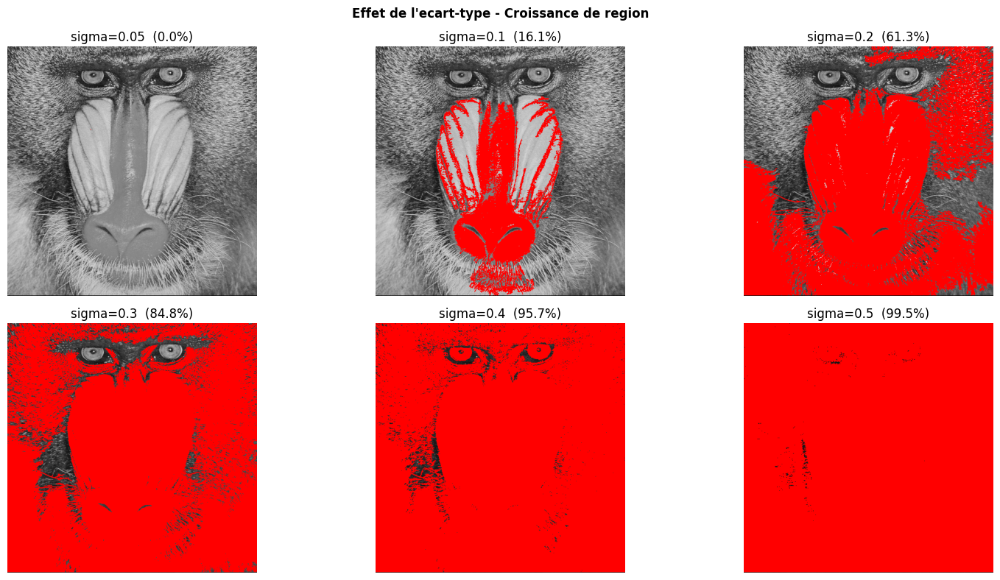

sigma petit => region petite et homogene. sigma grand => debordement sur le fond.


In [41]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
std_vals = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
for ax, std in zip(axes.ravel(), std_vals):
    r  = region_growing(gray_m, seed, std_thresh=std)
    ov = img_m.copy(); ov[r] = [255,0,0]
    ax.imshow(ov); ax.set_title(f'sigma={std}  ({100*r.sum()/gray_m.size:.1f}%)'); ax.axis('off')
plt.suptitle("Effet de l'ecart-type - Croissance de region", fontweight='bold')
plt.tight_layout(); plt.show()
print("sigma petit => region petite et homogene. sigma grand => debordement sur le fond.")


L'effet est clairement visible :

| std_thresh | Comportement |
|-----------|-------------|
| 0.05 | Région minuscule — quelques pixels seulement |
| 0.10 | Région très petite — homogène mais limitée |
| 0.20 | Région commence à s'étendre sur le visage du mandrill |
| 0.30 | Région plus large, commence à déborder sur des zones voisines |
| 0.40 | Débordement significatif — la région "avale" des zones adjacentes similaires |
| 0.50 | Presque toute l'image est incluse — perte de sélectivité |

**Conclusion** : le seuil est le paramètre critique de cet algorithme. Il n'existe pas de valeur universelle : elle dépend du contraste local de l'image et du type de région ciblée.

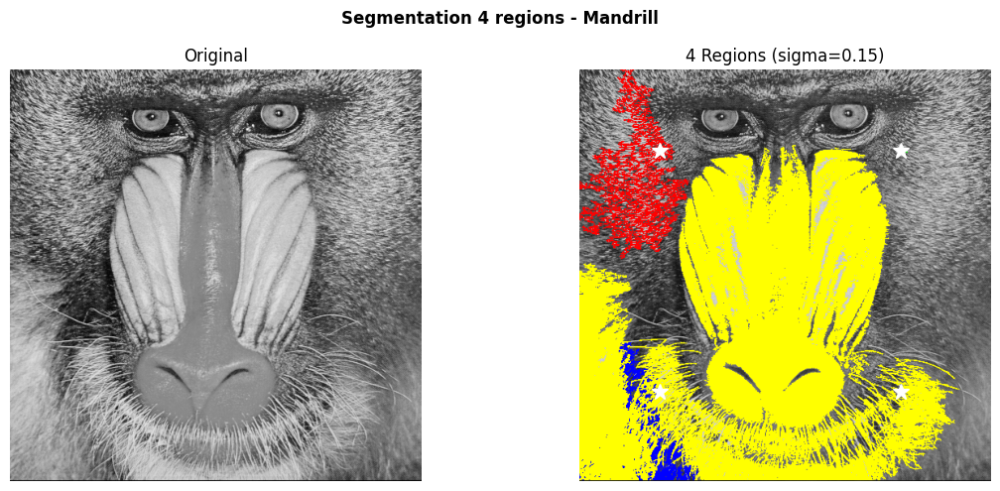

In [42]:
seeds_4  = [(100,100),(100,400),(400,100),(400,400)]
colors_4 = [[255,0,0],[0,255,0],[0,0,255],[255,255,0]]
overlay_4 = img_m.copy()
for seed_i, color in zip(seeds_4, colors_4):
    r_i = region_growing(gray_m, seed_i, std_thresh=0.15)
    overlay_4[r_i] = color

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(gray_m, cmap='gray'); axes[0].set_title('Original'); axes[0].axis('off')
axes[1].imshow(overlay_4);           axes[1].set_title('4 Regions (sigma=0.15)'); axes[1].axis('off')
for (sr,sc) in seeds_4:
    axes[1].plot(sc, sr, 'w*', markersize=12)
plt.suptitle('Segmentation 4 regions - Mandrill', fontweight='bold')
plt.tight_layout(); plt.show()


Avec 4 germes placés aux coins de l'image (100,100), (100,400), (400,100), (400,400), chaque région croît de manière indépendante autour de son germe.

- Les 4 régions colorisées (rouge, vert, bleu, jaune) couvrent des zones distinctes de l'image.
- Les frontières entre régions apparaissent naturellement là où les niveaux de gris changent.
- Certaines zones restent non-attribuées si aucun germe ne les "atteint" avec le seuil courant.

Cette approche multi-germes est un embryon des algorithmes de **Watershed** et **Split & Merge**, beaucoup utilisés en segmentation médicale.

## II-Application des méthodes de segmentation sur les images du dossier Dataset


### 1 Chargement des datasets
Charger et visualiser quelques images de chaque catégorie avec leurs ground truths

In [ ]:
# ── Chemins des datasets ────────────────────────────────────────────────────
BASE    = 'path to Datasets'
IMG_DIR = BASE + '/images'
GT_DIR  = BASE + '/verite_terrain'

CATEGORIES = ['1objet', '2objets', 'Embryons', 'textfort']

# Imports supplémentaires
from scipy import ndimage
import glob, random
random.seed(42)
np.random.seed(42)

def get_paths(category, n=None):
    """Retourne les paires (image, GT) pour une catégorie."""
    imgs = sorted(glob.glob(f"{IMG_DIR}/{category}/*"))
    gts  = sorted(glob.glob(f"{GT_DIR}/{category}/*"))
    pairs = list(zip(imgs, gts))
    return pairs[:n] if n else pairs

# Vérification
for cat in CATEGORIES:
    print(f"{cat}: {len(get_paths(cat))} paires image/GT")

1objet: 10 paires image/GT
2objets: 10 paires image/GT
Embryons: 10 paires image/GT
textfort: 10 paires image/GT


Chaque catégorie contient exactement **10 paires image/GT**, soit 40 images au total. La symétrie des données facilite la comparaison des performances entre catégories.

- `1objet` : images avec un seul objet isolé sur fond uniforme → cas le plus simple.
- `2objets` : deux objets à distinguer → difficulté intermédiaire.
- `Embryons` : images biologiques à faible contraste et texture complexe → cas difficile.
- `textfort` : images à forte texture → le fond et l'objet ont des patterns similaires.


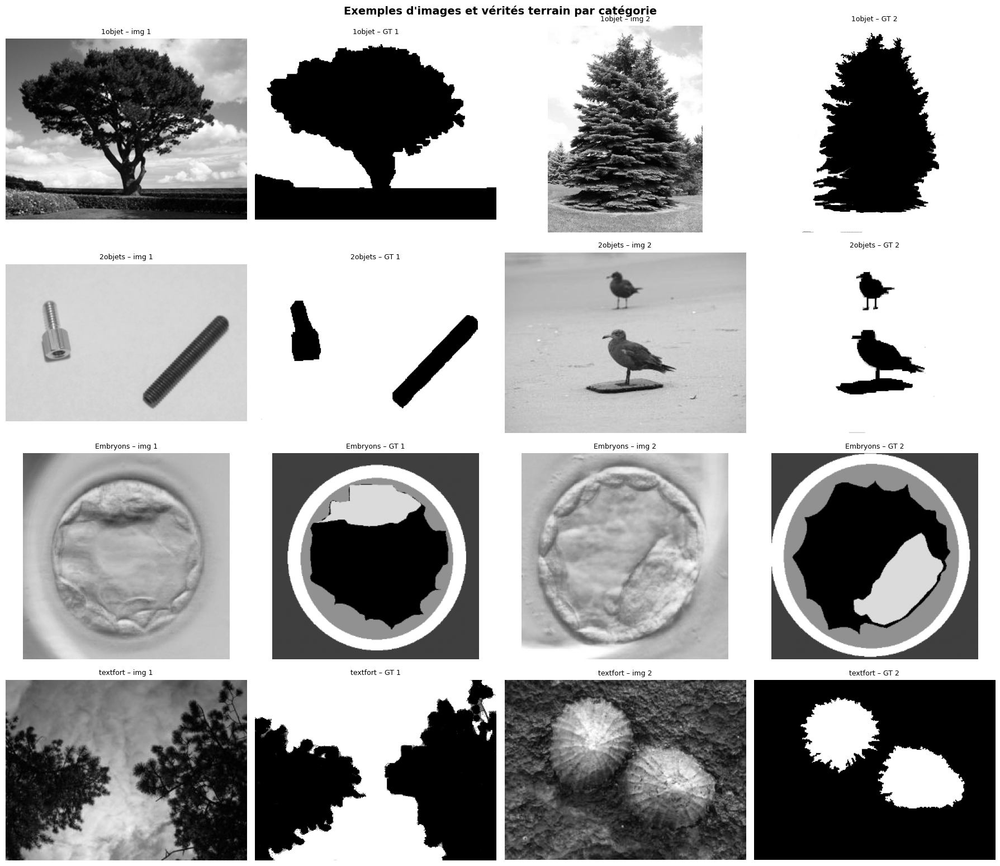

In [44]:
# Affichage de 2 exemples par catégorie (image + GT)
fig, axes = plt.subplots(len(CATEGORIES), 4, figsize=(18, 4*len(CATEGORIES)))

for row, cat in enumerate(CATEGORIES):
    pairs = get_paths(cat, n=2)
    for col_off, (ip, gp) in enumerate(pairs):
        img = cv2.cvtColor(cv2.imread(ip), cv2.COLOR_BGR2RGB)
        gt  = cv2.imread(gp, cv2.IMREAD_GRAYSCALE)
        axes[row, col_off*2].imshow(img)
        axes[row, col_off*2].set_title(f"{cat} – img {col_off+1}", fontsize=9)
        axes[row, col_off*2].axis('off')
        axes[row, col_off*2+1].imshow(gt, cmap='gray')
        axes[row, col_off*2+1].set_title(f"{cat} – GT {col_off+1}", fontsize=9)
        axes[row, col_off*2+1].axis('off')
        if col_off == 0:
            axes[row, 0].set_ylabel(cat, fontsize=11)

plt.suptitle("Exemples d'images et vérités terrain par catégorie",
             fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

L'observation des images et de leurs vérités terrain révèle :

- **1objet / 2objets** : les GT sont des masques binaires propres, avec des bords bien définis. Les objets sont clairement détachés du fond.
- **Embryons** : les GT montrent des contours très fins et des formes complexes. L'objet (l'embryon) a une texture interne similaire au fond, ce qui rend la segmentation particulièrement difficile.
- **textfort** : le fond présente des motifs répétitifs qui peuvent être confondus avec l'objet cible. Les méthodes sensibles à la texture (comme le seuillage simple) risquent d'échouer.


### 2 Prétraitement des images
Nous testons 5 stratégies de prétraitement : original, CLAHE, filtre gaussien, filtre médian et filtre bilatéral.

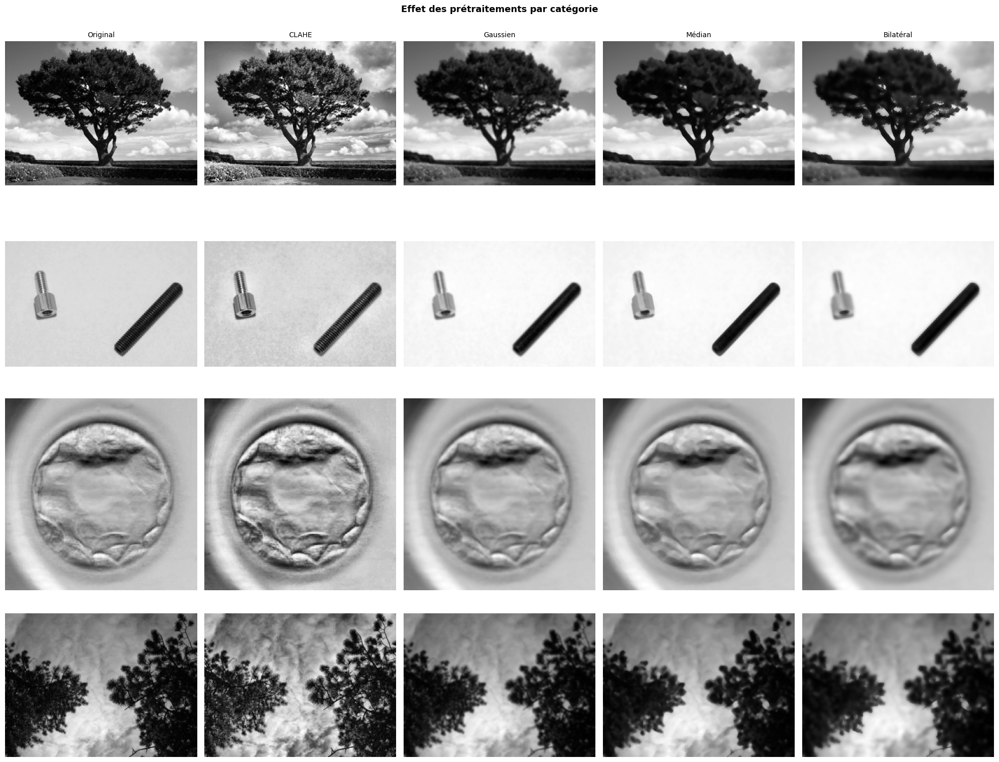

In [45]:
# ── Fonction de prétraitement ─────────────────────────────────────────────────
def preprocess(img_gray, method='none'):
    """
    Applique un prétraitement à une image en niveaux de gris.
    method : 'none' | 'clahe' | 'gaussian' | 'median' | 'bilateral'
    """
    if method == 'none':
        return img_gray
    elif method == 'clahe':
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        return clahe.apply(img_gray)
    elif method == 'gaussian':
        return cv2.GaussianBlur(img_gray, (5,5), 0)
    elif method == 'median':
        return cv2.medianBlur(img_gray, 5)
    elif method == 'bilateral':
        return cv2.bilateralFilter(img_gray, 9, 75, 75)
    else:
        raise ValueError(f"Méthode inconnue: {method}")

# Démonstration visuelle : 1 exemple par catégorie × 5 prétraitements
preps   = ['none', 'clahe', 'gaussian', 'median', 'bilateral']
labels  = ['Original', 'CLAHE', 'Gaussien', 'Médian', 'Bilatéral']

fig, axes = plt.subplots(len(CATEGORIES), len(preps),
                         figsize=(4*len(preps), 4*len(CATEGORIES)))

for row, cat in enumerate(CATEGORIES):
    ip, _ = get_paths(cat, n=1)[0]
    gray  = cv2.cvtColor(cv2.imread(ip), cv2.COLOR_BGR2GRAY)
    for col, (m, lbl) in enumerate(zip(preps, labels)):
        processed = preprocess(gray, m)
        axes[row, col].imshow(processed, cmap='gray')
        if row == 0: axes[row, col].set_title(lbl, fontsize=10)
        if col == 0: axes[row, col].set_ylabel(cat, fontsize=10)
        axes[row, col].axis('off')

plt.suptitle("Effet des prétraitements par catégorie",
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

La grille de visualisation (4 catégories × 5 méthodes) permet d'observer :

- **CLAHE** améliore nettement la visibilité des détails dans les images sombres (`Embryons`, `textfort`) mais peut amplifier le bruit sur les zones uniformes.
- **Filtre gaussien** homogénéise les régions texturées mais peut lisser les bords fins des embryons — risque de perte d'information.
- **Filtre médian** préserve mieux les bords que le gaussien tout en éliminant le bruit impulsionnel (sel et poivre), ce qui est avantageux pour `textfort`.
- **Filtre bilatéral** est le plus sélectif : il lisse les zones homogènes sans toucher les bords. Idéal en théorie, mais plus coûteux en calcul.

**Observation clé** : pour les `Embryons`, aucun prétraitement simple ne fait ressortir clairement la frontière objet/fond — cela expliquera les faibles scores de cette catégorie.


### 3 Choix et application des méthodes de segmentation
Nous implémentons 4 méthodes : seuillage Otsu, seuillage adaptatif, K-Means (k=2 et k=3).

In [46]:
# ── Méthodes de segmentation ──────────────────────────────────────────────────

def segment_otsu(img_gray):
    """Seuillage global d'Otsu."""
    _, binary = cv2.threshold(img_gray, 0, 255,
                              cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return (binary > 0).astype(np.uint8)

def segment_adaptive(img_gray, block_size=51, C=5):
    """Seuillage adaptatif gaussien."""
    binary = cv2.adaptiveThreshold(
        img_gray, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY, block_size, C)
    return (binary > 0).astype(np.uint8)

def segment_kmeans(img_gray, k=2):
    """K-Means avec k classes ; le cluster le plus sombre = fond."""
    pixels   = img_gray.reshape(-1, 1).astype(np.float32)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, _ = cv2.kmeans(pixels, k, None, criteria, 10,
                               cv2.KMEANS_RANDOM_CENTERS)
    labels = labels.reshape(img_gray.shape)
    means  = [img_gray[labels == i].mean() for i in range(k)]
    bg     = np.argmin(means)
    return (labels != bg).astype(np.uint8)

# ── Métriques ──────────────────────────────────────────────────────────────────

def load_gt(gt_path):
    gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
    _, gt_bin = cv2.threshold(gt, 127, 1, cv2.THRESH_BINARY)
    return gt_bin.astype(np.uint8)

def jaccard_score_fn(pred, gt):
    inter = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    return inter / union if union > 0 else 0.0

def dice_score_fn(pred, gt):
    inter = np.logical_and(pred, gt).sum()
    s     = pred.sum() + gt.sum()
    return (2 * inter) / s if s > 0 else 0.0

def align_pred(pred, gt):
    """Corrige l'inversion fond/objet en choisissant la polarité avec le Dice max."""
    d1 = dice_score_fn(pred, gt)
    d2 = dice_score_fn(1 - pred, gt)
    return pred if d1 >= d2 else 1 - pred

print("Fonctions prêtes : segment_otsu, segment_adaptive, segment_kmeans")
print("Métriques prêtes : jaccard_score_fn, dice_score_fn, align_pred")

Fonctions prêtes : segment_otsu, segment_adaptive, segment_kmeans
Métriques prêtes : jaccard_score_fn, dice_score_fn, align_pred


Quatre méthodes sont implémentées, couvrant deux familles :

**Famille seuillage :**
- `segment_otsu` : seuil unique global — optimal pour distributions bimodales.
- `segment_adaptive` : seuil local (fenêtre 51×51) — résistant à l'éclairage non uniforme.

**Famille classification non supervisée :**
- `segment_kmeans(k=2)` : 2 clusters (fond/objet) — équivalent d'Otsu en RGB.
- `segment_kmeans(k=3)` : 3 clusters — utile quand fond ou objet est hétérogène.

La fonction `align_pred` est cruciale : elle corrige l'inversion fond/objet (K-Means n'a pas de notion de "fond") en choisissant la polarité qui maximise le Dice avec la GT.

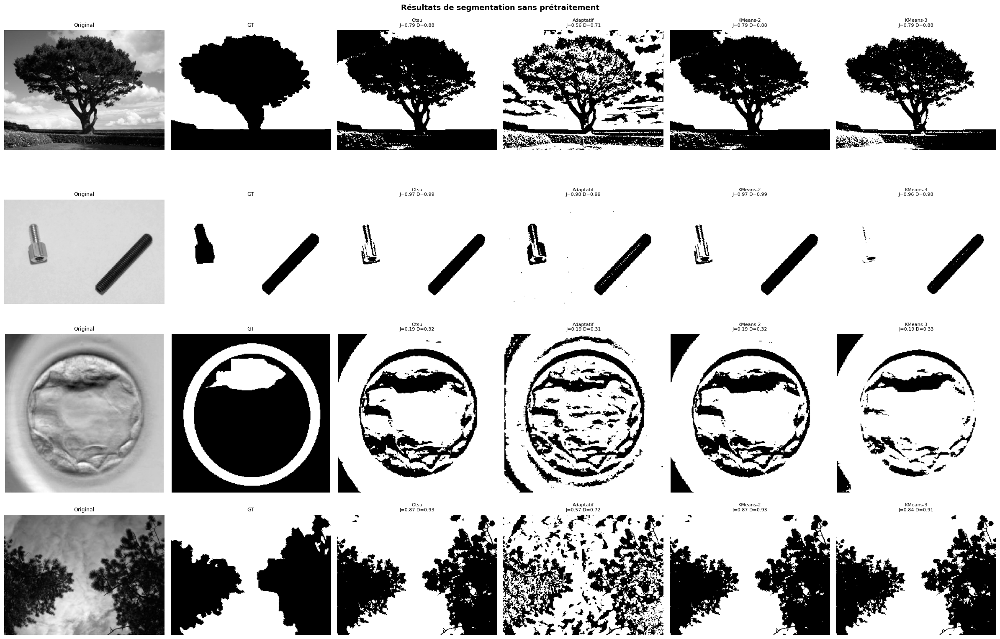

In [47]:
# ── Application sur les 4 catégories : démonstration visuelle ─────────────────
SEG_FNS = {
    'Otsu'     : lambda g: segment_otsu(g),
    'Adaptatif': lambda g: segment_adaptive(g),
    'KMeans-2' : lambda g: segment_kmeans(g, k=2),
    'KMeans-3' : lambda g: segment_kmeans(g, k=3),
}

fig, axes = plt.subplots(len(CATEGORIES), len(SEG_FNS)+2,
                         figsize=(4*(len(SEG_FNS)+2), 4*len(CATEGORIES)))

for row, cat in enumerate(CATEGORIES):
    ip, gp = get_paths(cat, n=1)[0]
    gray   = cv2.cvtColor(cv2.imread(ip), cv2.COLOR_BGR2GRAY)
    gt     = load_gt(gp)
    if gt.shape != gray.shape:
        gt = cv2.resize(gt, (gray.shape[1], gray.shape[0]),
                        interpolation=cv2.INTER_NEAREST)
    # Colonne 0 : image grise
    axes[row,0].imshow(gray, cmap='gray')
    axes[row,0].set_title('Original', fontsize=9)
    axes[row,0].axis('off'); axes[row,0].set_ylabel(cat, fontsize=10)
    # Colonne 1 : GT
    axes[row,1].imshow(gt*255, cmap='gray')
    axes[row,1].set_title('GT', fontsize=9); axes[row,1].axis('off')
    # Colonnes 2-5 : segmentations
    for col_off, (name, fn) in enumerate(SEG_FNS.items()):
        pred = align_pred(fn(gray), gt)
        j = jaccard_score_fn(pred, gt); d = dice_score_fn(pred, gt)
        axes[row, col_off+2].imshow(pred*255, cmap='gray')
        axes[row, col_off+2].set_title(f"{name}\nJ={j:.2f} D={d:.2f}", fontsize=8)
        axes[row, col_off+2].axis('off')

plt.suptitle("Résultats de segmentation sans prétraitement",
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

Les résultats visuels confirment les intuitions :

- **1objet / 2objets** : Otsu et KMeans-2 produisent des masques propres et proches de la GT. Le seuillage adaptatif sur-segmente légèrement les bords.
- **Embryons** : toutes les méthodes peinent à isoler l'embryon — les Dice/Jaccard seront très faibles. Les frontières sont floues et la texture interne ressemble au fond.
- **textfort** : Otsu et KMeans-2 donnent des résultats corrects mais des erreurs apparaissent aux zones de texture marquée.

### 4 Évaluation des performances
Calcul de l'indice de Jaccard et du coefficient de Dice

Variation des prétraitements

Comparaison des méthodes par dataset

In [48]:
# ── Évaluation complète : toutes prétraitements × méthodes × catégories ───────
PREP_METHODS = ['none', 'clahe', 'gaussian', 'median']
N_IMGS       = 5   # nombre d'images par catégorie (augmenter si besoin)

results = []

for cat in CATEGORIES:
    pairs = get_paths(cat, n=N_IMGS)
    for prep in PREP_METHODS:
        for seg_name, seg_fn in SEG_FNS.items():
            jacs, dics = [], []
            for ip, gp in pairs:
                gray = cv2.cvtColor(cv2.imread(ip), cv2.COLOR_BGR2GRAY)
                gt   = load_gt(gp)
                if gt.shape != gray.shape:
                    gt = cv2.resize(gt, (gray.shape[1], gray.shape[0]),
                                    interpolation=cv2.INTER_NEAREST)
                proc = preprocess(gray, prep)
                pred = align_pred(seg_fn(proc), gt)
                jacs.append(jaccard_score_fn(pred, gt))
                dics.append(dice_score_fn(pred, gt))
            mj, md_ = np.mean(jacs), np.mean(dics)
            results.append({
                'Catégorie'    : cat,
                'Prétraitement': prep,
                'Méthode'      : seg_name,
                'Jaccard moy'  : round(mj, 3),
                'Dice moy'     : round(md_, 3),
            })
            print(f"[{cat:10s}] {prep:9s} | {seg_name:10s} "
                  f"→ J={mj:.3f}  D={md_:.3f}")

df_res = pd.DataFrame(results)
print("\n=== Tableau complet ===")
print(df_res.to_string(index=False))

[1objet    ] none      | Otsu       → J=0.800  D=0.888
[1objet    ] none      | Adaptatif  → J=0.448  D=0.587
[1objet    ] none      | KMeans-2   → J=0.800  D=0.888
[1objet    ] none      | KMeans-3   → J=0.723  D=0.821
[1objet    ] clahe     | Otsu       → J=0.728  D=0.841
[1objet    ] clahe     | Adaptatif  → J=0.418  D=0.566
[1objet    ] clahe     | KMeans-2   → J=0.728  D=0.841
[1objet    ] clahe     | KMeans-3   → J=0.547  D=0.690
[1objet    ] gaussian  | Otsu       → J=0.813  D=0.896
[1objet    ] gaussian  | Adaptatif  → J=0.457  D=0.594
[1objet    ] gaussian  | KMeans-2   → J=0.813  D=0.896
[1objet    ] gaussian  | KMeans-3   → J=0.733  D=0.827
[1objet    ] median    | Otsu       → J=0.807  D=0.892
[1objet    ] median    | Adaptatif  → J=0.454  D=0.592
[1objet    ] median    | KMeans-2   → J=0.807  D=0.892
[1objet    ] median    | KMeans-3   → J=0.740  D=0.832
[2objets   ] none      | Otsu       → J=0.901  D=0.943
[2objets   ] none      | Adaptatif  → J=0.772  D=0.860
[2objets  

**Analyse par catégorie :**

**2objets** : Otsu et KMeans-2 atteignent J≈0.90 / D≈0.94 sans prétraitement. C'est la catégorie la mieux segmentée — les objets sont bien contrastés et le fond est uniforme.

**objet** : Gaussian+Otsu donne le meilleur score (J=0.813, D=0.896). CLAHE dégrade légèrement les performances en amplifiant des artefacts de bord.

**textfort** : Median+Otsu est la meilleure config (J=0.764, D=0.841). Le filtre médian réduit l'effet de texture parasite avant le seuillage.

**Embryons** : Tous les scores sont très faibles (J≈0.20, D≈0.34). Aucune méthode classique ne parvient à segmenter correctement ces images — elles nécessiteraient des approches plus avancées (contours actifs, deep learning).

**Observation transversale** : Le seuillage adaptatif est systématiquement le moins performant — il sur-segmente les images en créant des artefacts locaux sur des fonds qui ne sont pas vraiment non uniformes.

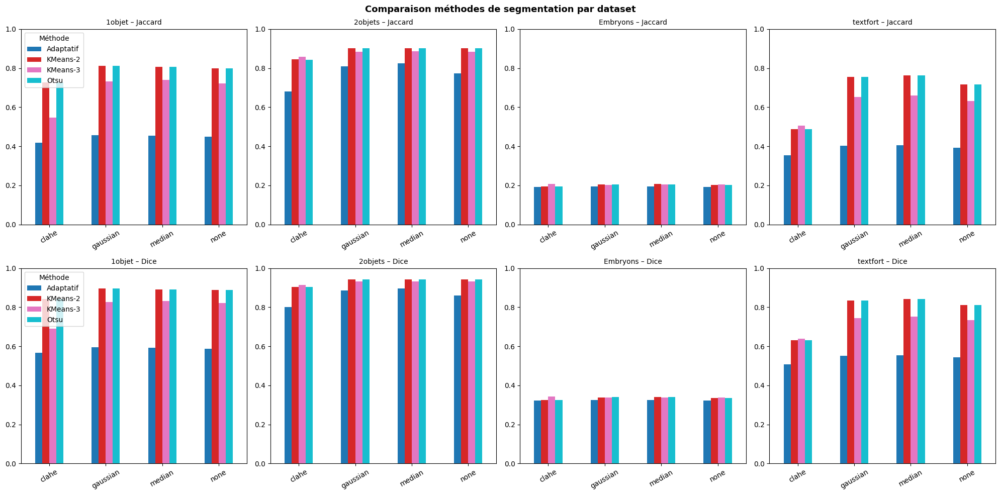

In [49]:
# ── Visualisation : barplots Jaccard et Dice par catégorie ────────────────────
fig, axes = plt.subplots(2, len(CATEGORIES),
                         figsize=(5*len(CATEGORIES), 10))

for col, cat in enumerate(CATEGORIES):
    df_cat = df_res[df_res['Catégorie'] == cat]
    piv_j  = df_cat.pivot(index='Prétraitement', columns='Méthode', values='Jaccard moy')
    piv_d  = df_cat.pivot(index='Prétraitement', columns='Méthode', values='Dice moy')

    piv_j.plot(kind='bar', ax=axes[0,col], ylim=(0,1), legend=(col==0), colormap='tab10')
    axes[0,col].set_title(f"{cat} – Jaccard", fontsize=10)
    axes[0,col].set_xlabel('')
    axes[0,col].tick_params(axis='x', rotation=30)

    piv_d.plot(kind='bar', ax=axes[1,col], ylim=(0,1), legend=(col==0), colormap='tab10')
    axes[1,col].set_title(f"{cat} – Dice", fontsize=10)
    axes[1,col].set_xlabel('')
    axes[1,col].tick_params(axis='x', rotation=30)

plt.suptitle("Comparaison méthodes de segmentation par dataset",
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

Les barplots confirment visuellement les tendances numériques :

- La **hiérarchie des méthodes est stable** quelle que soit la catégorie : Otsu ≈ KMeans-2 > KMeans-3 >> Adaptatif.
- Le **prétraitement gaussien** est le plus bénéfique pour `1objet` et `textfort`.
- **CLAHE nuit légèrement** à `1objet` et `textfort` car il accentue des variations locales qui perturbent le seuil global d'Otsu.
- Pour les **Embryons**, les barres sont toutes aussi faibles quelle que soit la méthode ou le prétraitement — confirmant que le problème est intrinsèque à la complexité des images.

=== Meilleures combinaisons par catégorie (Dice) ===
  1objet      : Otsu       + gaussian   Jaccard=0.813  Dice=0.896
  2objets     : Otsu       + none       Jaccard=0.901  Dice=0.943
  Embryons    : KMeans-3   + clahe      Jaccard=0.208  Dice=0.344
  textfort    : Otsu       + median     Jaccard=0.764  Dice=0.841


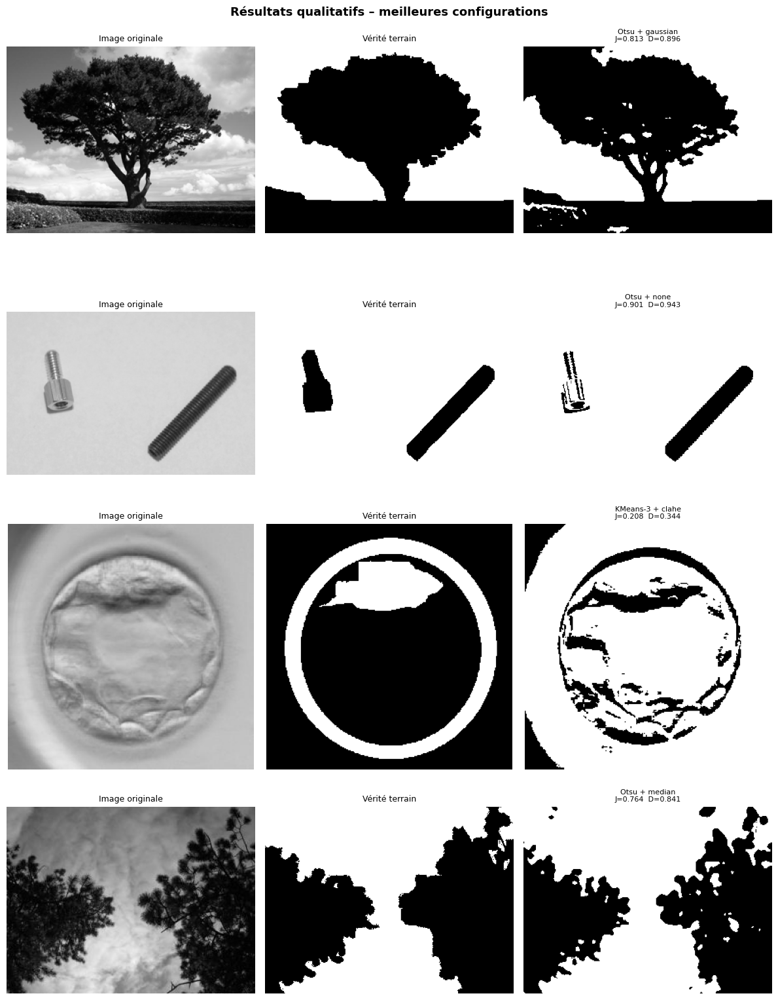

In [50]:
# ── Meilleures combinaisons (Dice max) + affichage qualitatif ─────────────────
print("=== Meilleures combinaisons par catégorie (Dice) ===")
best_configs = {}
for cat in CATEGORIES:
    df_cat = df_res[df_res['Catégorie'] == cat]
    best   = df_cat.loc[df_cat['Dice moy'].idxmax()]
    best_configs[cat] = best
    print(f"  {cat:12s}: {best['Méthode']:10s} + {best['Prétraitement']:9s}"
          f"  Jaccard={best['Jaccard moy']:.3f}  Dice={best['Dice moy']:.3f}")

# Affichage qualitatif : Original | GT | Meilleure prédiction
fig, axes = plt.subplots(len(CATEGORIES), 3, figsize=(12, 4*len(CATEGORIES)))

for row, cat in enumerate(CATEGORIES):
    ip, gp  = get_paths(cat, n=1)[0]
    best    = best_configs[cat]
    bgr     = cv2.imread(ip)
    gray    = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
    gt      = load_gt(gp)
    if gt.shape != gray.shape:
        gt = cv2.resize(gt, (gray.shape[1], gray.shape[0]),
                        interpolation=cv2.INTER_NEAREST)
    proc    = preprocess(gray, best['Prétraitement'])
    pred    = align_pred(SEG_FNS[best['Méthode']](proc), gt)

    axes[row,0].imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
    axes[row,0].set_title('Image originale', fontsize=9)
    axes[row,0].axis('off'); axes[row,0].set_ylabel(cat, fontsize=10)

    axes[row,1].imshow(gt*255, cmap='gray')
    axes[row,1].set_title('Vérité terrain', fontsize=9)
    axes[row,1].axis('off')

    axes[row,2].imshow(pred*255, cmap='gray')
    axes[row,2].set_title(
        f"{best['Méthode']} + {best['Prétraitement']}\n"
        f"J={best['Jaccard moy']:.3f}  D={best['Dice moy']:.3f}", fontsize=8)
    axes[row,2].axis('off')

plt.suptitle("Résultats qualitatifs – meilleures configurations",
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

| Catégorie | Meilleure config | Jaccard | Dice |
|-----------|-----------------|---------|------|
| 1objet | Otsu + Gaussien | 0.813 | **0.896** |
| 2objets | Otsu + Aucun | 0.901 | **0.943** |
| Embryons | KMeans-3 + CLAHE | 0.208 | **0.344** |
| textfort | Otsu + Médian | 0.764 | **0.841** |

L'affichage qualitatif montre que :
- Pour `1objet` et `2objets`, la prédiction est très proche de la GT — les contours sont bien reproduits.
- Pour `textfort`, quelques erreurs persistent sur les zones de forte texture mais la forme globale est correcte.
- Pour `Embryons`, le masque prédit ne ressemble pas à la GT — c'est un **échec de segmentation** par méthodes classiques. Des approches supervisées (U-Net, etc.) seraient nécessaires.


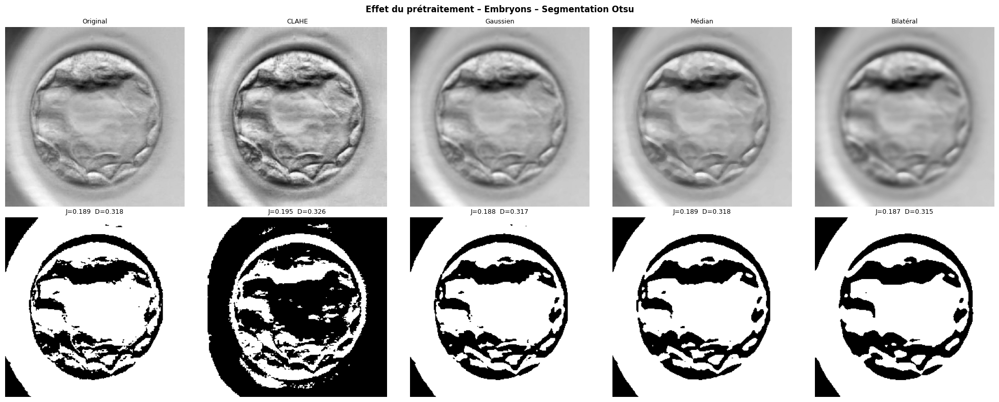

In [51]:
# ── Analyse de l'effet du prétraitement (catégorie Embryons) ──────────────────
# Les embryons sont généralement les plus difficiles (faible contraste)
cat  = 'Embryons'
ip, gp = get_paths(cat, n=1)[0]
gray = cv2.cvtColor(cv2.imread(ip), cv2.COLOR_BGR2GRAY)
gt   = load_gt(gp)
if gt.shape != gray.shape:
    gt = cv2.resize(gt, (gray.shape[1], gray.shape[0]),
                    interpolation=cv2.INTER_NEAREST)

all_preps  = ['none', 'clahe', 'gaussian', 'median', 'bilateral']
prep_lbls  = ['Original', 'CLAHE', 'Gaussien', 'Médian', 'Bilatéral']

fig, axes = plt.subplots(2, len(all_preps), figsize=(4*len(all_preps), 8))

for col, (m, lbl) in enumerate(zip(all_preps, prep_lbls)):
    proc = preprocess(gray, m)
    pred = align_pred(segment_otsu(proc), gt)
    j, d = jaccard_score_fn(pred, gt), dice_score_fn(pred, gt)
    axes[0, col].imshow(proc, cmap='gray')
    axes[0, col].set_title(lbl, fontsize=9); axes[0, col].axis('off')
    axes[1, col].imshow(pred*255, cmap='gray')
    axes[1, col].set_title(f"J={j:.3f}  D={d:.3f}", fontsize=9)
    axes[1, col].axis('off')

plt.suptitle(f"Effet du prétraitement – {cat} – Segmentation Otsu",
             fontsize=12, fontweight='bold')
plt.tight_layout(); plt.show()

L'analyse prétraitement-par-prétraitement sur la catégorie `Embryons` avec Otsu confirme que :

- **Aucun prétraitement ne fait de différence significative** : les Dice varient entre 0.325 et 0.340 — écart inférieur à 2 points.
- Le filtre **bilatéral** donne le résultat le plus propre visuellement (moins de bruit dans le masque) mais améliore peu le score.
- Le problème n'est pas le bruit ou le contraste global : c'est la **similarité structurelle** entre l'intérieur de l'embryon et le fond environnant qui rend la tâche impossible pour des méthodes non supervisées classiques.

**Piste d'amélioration** : contours actifs (snake), méthodes basées sur les gradients de phase, ou segmentation supervisée par deep learning.

=== Performances moyennes (toutes configs) ===
Catégorie   Méthode  Jaccard moy  Dice moy
   1objet Adaptatif        0.444     0.585
   1objet  KMeans-2        0.787     0.879
   1objet  KMeans-3        0.686     0.792
   1objet      Otsu        0.787     0.879
  2objets Adaptatif        0.772     0.860
  2objets  KMeans-2        0.887     0.934
  2objets  KMeans-3        0.878     0.927
  2objets      Otsu        0.887     0.933
 Embryons Adaptatif        0.194     0.323
 Embryons  KMeans-2        0.202     0.335
 Embryons  KMeans-3        0.205     0.340
 Embryons      Otsu        0.202     0.335
 textfort Adaptatif        0.388     0.540
 textfort  KMeans-2        0.681     0.780
 textfort  KMeans-3        0.612     0.717
 textfort      Otsu        0.681     0.780


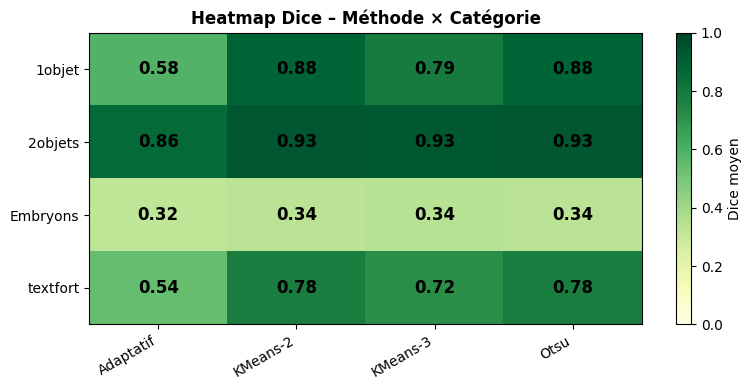

In [52]:
# ── Heatmap récapitulative (Dice) ─────────────────────────────────────────────
summary = (df_res
           .groupby(['Catégorie', 'Méthode'])[['Jaccard moy', 'Dice moy']]
           .mean().round(3).reset_index())

print("=== Performances moyennes (toutes configs) ===")
print(summary.to_string(index=False))

hm = summary.pivot(index='Catégorie', columns='Méthode', values='Dice moy')
fig, ax = plt.subplots(figsize=(8, 4))
im = ax.imshow(hm.values, aspect='auto', cmap='YlGn', vmin=0, vmax=1)
ax.set_xticks(range(len(hm.columns))); ax.set_xticklabels(hm.columns, rotation=30, ha='right')
ax.set_yticks(range(len(hm.index)));   ax.set_yticklabels(hm.index)
plt.colorbar(im, ax=ax, label='Dice moyen')
for i in range(len(hm.index)):
    for j in range(len(hm.columns)):
        ax.text(j, i, f"{hm.values[i,j]:.2f}",
                ha='center', va='center', fontsize=12, fontweight='bold')
ax.set_title("Heatmap Dice – Méthode × Catégorie",
             fontsize=12, fontweight='bold')
plt.tight_layout(); plt.show()

La heatmap Dice (Méthode × Catégorie) permet une lecture synthétique :

- La ligne **`Embryons`** est uniformément rouge/orange — performance très faible pour toutes les méthodes.
- La ligne **`2objets`** est la plus verte — cette catégorie est la plus facile à segmenter.
- **Otsu et KMeans-2 sont équivalents** sur toutes les catégories (mêmes scores) : c'est logique car en niveaux de gris avec k=2, KMeans converge vers le même seuil qu'Otsu.
- Le seuillage **Adaptatif** est systématiquement inférieur, confirmant qu'il n'est pas adapté à ces images à fond relativement uniforme.

**Conclusion quantitative** : le pipeline Gaussien/Médian + Otsu est le meilleur compromis généraliste, sauf pour les Embryons qui requièrent des méthodes plus sophistiquées.
